In [1]:
from pathlib import Path 
import glob
import openslide 
import os 
import torch 
from PIL import Image
import geopandas as gpd
from IPython.display import display
from trident import OpenSlideWSI
from trident.segmentation_models import segmentation_model_factory
import tifftools
import shutil
import matplotlib.pyplot as plt

### Slides that are stain normalised are saved in .tif format which sets MPP to 1000 um per unit (tiff resolution setting 10 pixels per cm) which is not compatible with Openslide 
### for it to read the slides and hence we are using tifftools to modify slide properties (based on actual slide properties of unnormalised .svs slides; Aperio format)

# normalised_folder = Path("/home/sai/MYC_normalised/normalised_images/") 

# file_list = list(normalised_folder.glob("*"))

new_normalised_folder = Path("/home/sai/MYC_normalised/new_normalised_images/")

# shutil.rmtree(new_normalised_folder, ignore_errors=True)

# new_normalised_folder.mkdir(parents=True, exist_ok=True)

# for file in file_list:
#     tifftools.tiff_set( 
#     str(file),
#     str(new_normalised_folder / file.name),
#     setlist = [('ImageDescription',"Aperio Fake |AppMag = 20|MPP = 0.5")]) 

file_list = list(new_normalised_folder.glob("*")) 

file_names = [file.name for file in file_list]

print(file_names) 

## slide properties check 

slide_path = "/home/sai/MYC_normalised/new_normalised_images/normalised_image_NMB_330.tif"

slide = openslide.OpenSlide(slide_path)

print(f"Modified MPP: {slide.properties[openslide.PROPERTY_NAME_MPP_X]}")

print(f"Modified Magnification: {slide.properties[openslide.PROPERTY_NAME_OBJECTIVE_POWER]}")

slides = [OpenSlideWSI(slide_path = file, lazy_init = False) for file in file_list] 

print(len(slides)) 



MMMMMMMMMMMMMMMMMMM.............................................................
M...B....C....D...M.MMMMMMMMMM.......MM........MM.....................MM7.......
M...MM...M...MM...M.....MM.....................MM.....................MM7.......
M....MM..M..MM....M.....MM...MMMMMM..MM..MMMMMMMM..MMMMMMM..MMDMMMMM MMMMMMM....
M....MM..M..MM....M.....MM...MM ..MM.MM. MM....MM.,MM...MM+.MM....MM..MM7.......
M.....MMMMMMM.....M.....MM...MM......MM. MM....MM.8MMMMMMMD.MM....MM..MM7.......
M....... M........M.....MM...MM......MM..MM...8MM. MM...._..MM....MM..MMZ.MM ...
M........M........M.....MM...MM......MM..MMMMM.MM. MMMMMMM..MM....MM...MMMMM....
MMMMMMMMMMMMMMMMMMM.............................................................

It appears that this is your first time using Trident.  To finalize your
Trident installation, you must:
 * create a `~/.trident` directory
 * create a config.tri file in your `~/.trident` directory
 * download an ion table file for calculating ionization fractions

Yo

  Unzipping file: hm2012_hr.h5.gz

Installation complete.  I recommend verifying your installation
to assure that everything is working.  Try: trident.verify()


ImportError: cannot import name 'OpenSlideWSI' from 'trident' (/home/sai/miniconda3/envs/patho-sam/lib/python3.13/site-packages/trident/__init__.py)

In [4]:
# import inspect
# from trident.segmentation_models import HESTSegmenter
# print(inspect.getsource(HESTSegmenter._build))

# from trident.wsi_objects import WSI
# print(inspect.getsource(WSI.WSI.segment_tissue))

In [5]:
##Tissue Segementation 

segmentation_model = segmentation_model_factory("hest") 

TARGET_MAG = 20
PATCH_SIZE = 256

DEVICE = f"cuda:0" if torch.cuda.is_available() else "cpu"

Output_folder = "/home/sai/MYC_normalised/segmented/hest-2/"

shutil.rmtree(Output_folder, ignore_errors=True)

os.makedirs(Output_folder, exist_ok = True)

masks_and_patches = []

for slide in slides:
    mask = slide.segment_tissue(
        segmentation_model=segmentation_model,
        target_mag=10,
        job_dir=Output_folder,
        device=DEVICE,
        holes_are_tissue=False,
    )
    
    patches = slide.extract_tissue_coords(
        target_mag=TARGET_MAG,
        patch_size=PATCH_SIZE,
        save_coords=Output_folder,
        min_tissue_proportion = 0.25
    )
    
    patches_viz = slide.visualize_coords(
        coords_path=patches,
        save_patch_viz=os.path.join(Output_folder, "visualization")
    )
    
    masks_and_patches.append((
        Path(slide.slide_path).stem,
        mask,
        patches,
        patches_viz
    ))
    
    print(f"Done: {Path(slide.slide_path).stem}")


for name,mask,patches,patches_viz in masks_and_patches:
    print(name)
    gdf = gpd.read_file(mask)
    print(gdf.head(n = 10)) 


# new_normalised_folder = Path("/home/sai/MYC_normalised/new_normalised_images/")

# file_list = list(new_normalised_folder.glob("*")) 

# contour_images = []

# for file in file_list:
#         img = Image.open(os.path.join(Output_folder, 
#                             'contours', 
#                             file.name.replace('.tif', '.jpg')))
#         contour_images.append((file.name,img))

# print(len(contour_images)) 


# for contour_image in contour_images:
#         name,img = contour_image
#         print(name)
#         display(img)                                         


Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

Done: normalised_image_NMB_178
Done: normalised_image_NMB_658
Done: normalised_image_NMB_769
Done: normalised_image_NMB_188
Done: normalised_image_NMB_329
Done: normalised_image_NMB_374
Done: normalised_image_NMB_326
Done: normalised_image_NMB_318
Done: normalised_image_NMB_344
Done: normalised_image_NMB_335
Done: normalised_image_NMB_167
Done: normalised_image_NMB_892
Done: normalised_image_NMB_82
Done: normalised_image_NMB_169
Done: normalised_image_NMB_330
Done: normalised_image_NMB_638
Done: normalised_image_NMB_171
Done: normalised_image_NMB_17
Done: normalised_image_NMB_331
Done: normalised_image_NMB_361
Done: normalised_image_NMB_145
Done: normalised_image_NMB_166
Done: normalised_image_NMB_636
Done: normalised_image_NMB_499
Done: normalised_image_NMB_333
Done: normalised_image_NMB_535
normalised_image_NMB_178
   tissue_id                                           geometry
0          0  POLYGON ((33372 40607.9, 33371.99 40607.9, 333...
1          1  POLYGON ((36909 36719.9, 3690

In [6]:
###Checking the contents of the patch files 

import h5py 

Output_folder = "/home/sai/MYC_normalised/segmented/hest-2/"

def print_attrs(name, obj):
    print(f"Object: {name}")
    for key, value in obj.attrs.items():
        print(f"  Attribute - {key}: {value}")

for name,mask,patches,viz_patches in masks_and_patches:
    print(f"Contents and Attributes in patch coords file: {name}")
    with h5py.File(patches, 'r') as h5_file:
         print(f"Contents and Attributes in patch coords file:{Path(patches).stem}")
         h5_file.visititems(print_attrs)

Contents and Attributes in patch coords file: normalised_image_NMB_178
Contents and Attributes in patch coords file:normalised_image_NMB_178_patches
Object: coords
  Attribute - level0_height: 54000
  Attribute - level0_magnification: 20
  Attribute - level0_width: 54000
  Attribute - name: normalised_image_NMB_178
  Attribute - overlap: 0
  Attribute - patch_size: 256
  Attribute - patch_size_level0: 256
  Attribute - savetodir: /home/sai/MYC_normalised/segmented/hest-2/
  Attribute - target_magnification: 20
Contents and Attributes in patch coords file: normalised_image_NMB_658
Contents and Attributes in patch coords file:normalised_image_NMB_658_patches
Object: coords
  Attribute - level0_height: 40464
  Attribute - level0_magnification: 20
  Attribute - level0_width: 40464
  Attribute - name: normalised_image_NMB_658
  Attribute - overlap: 0
  Attribute - patch_size: 256
  Attribute - patch_size_level0: 256
  Attribute - savetodir: /home/sai/MYC_normalised/segmented/hest-2/
  Attri

In [7]:
### Exporting generated tissue masks as GeoJSON objects to upload and visualise in QuPath 

import h5py 
import json 
from pathlib import Path 

Output_folder = "/home/sai/MYC_normalised/segmented/hest-2/"
new_normalised_folder = Path("/home/sai/MYC_normalised/new_normalised_images/")

GEOJSON_OUTPUT_DIR = Path("/home/sai/QuPath_export/")

GEOJSON_OUTPUT_DIR.mkdir(parents = True,exist_ok = True)

file_list = list(new_normalised_folder.glob("*")) 

file_names = [Path(file).stem for file in file_list] 

masks_and_patches = []

for name in file_names:
    mask = os.path.join(Output_folder,"contours_geojson",f"{name}.geojson")
    patches = os.path.join(Output_folder,"patches",f"{name}_patches.h5")
    viz_patches = os.path.join(Output_folder,"visualization",f"{name}.jpg")
    masks_and_patches.append((name,mask,patches,viz_patches)) 


def print_attrs(name, obj):
    print(f"Object: {name}")
    for key, value in obj.attrs.items():
        print(f"  Attribute - {key}: {value}")

for name,mask,patches,viz_patches in masks_and_patches:
    if not os.path.exists(patches):
        print(f" No h5 file found for {name}")
        continue
    print(f"Contents and Attributes in patch coords file: {name}")
    with h5py.File(patches, 'r') as h5_file:
         print(f"Contents and Attributes in patch coords file:{Path(patches).stem}")
         h5_file.visititems(print_attrs)

for name, mask, patches, viz_patches in masks_and_patches:
    print(name)
    display(viz_patches)


for name, mask,patches, viz_patches in masks_and_patches:
    if not os.path.exists(mask):
        print(f"No tissue masks found for {name}")
        continue

    with open(mask) as f:
        gj = json.load(f)
    for feat in gj["features"]:
        feat["properties"]["objectType"] = "annotation"
        feat["properties"]["name"] = f"tissue_{feat['properties']['tissue_id']}"

    out_path = GEOJSON_OUTPUT_DIR / f"{name}_mask.geojson"
    with open(out_path, "w") as f:
        json.dump(gj,f) 
    print(f"{name}'s masks GeoJSON annotation has been updated") 


Contents and Attributes in patch coords file: normalised_image_NMB_178
Contents and Attributes in patch coords file:normalised_image_NMB_178_patches
Object: coords
  Attribute - level0_height: 54000
  Attribute - level0_magnification: 20
  Attribute - level0_width: 54000
  Attribute - name: normalised_image_NMB_178
  Attribute - overlap: 0
  Attribute - patch_size: 256
  Attribute - patch_size_level0: 256
  Attribute - savetodir: /home/sai/MYC_normalised/segmented/hest-2/
  Attribute - target_magnification: 20
Contents and Attributes in patch coords file: normalised_image_NMB_658
Contents and Attributes in patch coords file:normalised_image_NMB_658_patches
Object: coords
  Attribute - level0_height: 40464
  Attribute - level0_magnification: 20
  Attribute - level0_width: 40464
  Attribute - name: normalised_image_NMB_658
  Attribute - overlap: 0
  Attribute - patch_size: 256
  Attribute - patch_size_level0: 256
  Attribute - savetodir: /home/sai/MYC_normalised/segmented/hest-2/
  Attri

'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_178.jpg'

normalised_image_NMB_658


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_658.jpg'

normalised_image_NMB_769


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_769.jpg'

normalised_image_NMB_188


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_188.jpg'

normalised_image_NMB_329


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_329.jpg'

normalised_image_NMB_374


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_374.jpg'

normalised_image_NMB_326


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_326.jpg'

normalised_image_NMB_318


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_318.jpg'

normalised_image_NMB_344


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_344.jpg'

normalised_image_NMB_335


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_335.jpg'

normalised_image_NMB_167


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_167.jpg'

normalised_image_NMB_892


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_892.jpg'

normalised_image_NMB_82


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_82.jpg'

normalised_image_NMB_169


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_169.jpg'

normalised_image_NMB_330


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_330.jpg'

normalised_image_NMB_638


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_638.jpg'

normalised_image_NMB_171


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_171.jpg'

normalised_image_NMB_17


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_17.jpg'

normalised_image_NMB_331


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_331.jpg'

normalised_image_NMB_361


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_361.jpg'

normalised_image_NMB_145


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_145.jpg'

normalised_image_NMB_166


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_166.jpg'

normalised_image_NMB_636


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_636.jpg'

normalised_image_NMB_499


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_499.jpg'

normalised_image_NMB_333


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_333.jpg'

normalised_image_NMB_535


'/home/sai/MYC_normalised/segmented/hest-2/visualization/normalised_image_NMB_535.jpg'

normalised_image_NMB_178's masks GeoJSON annotation has been updated
normalised_image_NMB_658's masks GeoJSON annotation has been updated
normalised_image_NMB_769's masks GeoJSON annotation has been updated
normalised_image_NMB_188's masks GeoJSON annotation has been updated
normalised_image_NMB_329's masks GeoJSON annotation has been updated
normalised_image_NMB_374's masks GeoJSON annotation has been updated
normalised_image_NMB_326's masks GeoJSON annotation has been updated
normalised_image_NMB_318's masks GeoJSON annotation has been updated
normalised_image_NMB_344's masks GeoJSON annotation has been updated
normalised_image_NMB_335's masks GeoJSON annotation has been updated
normalised_image_NMB_167's masks GeoJSON annotation has been updated
normalised_image_NMB_892's masks GeoJSON annotation has been updated
normalised_image_NMB_82's masks GeoJSON annotation has been updated
normalised_image_NMB_169's masks GeoJSON annotation has been updated
normalised_image_NMB_330's masks Ge

normalised_image_NMB_178


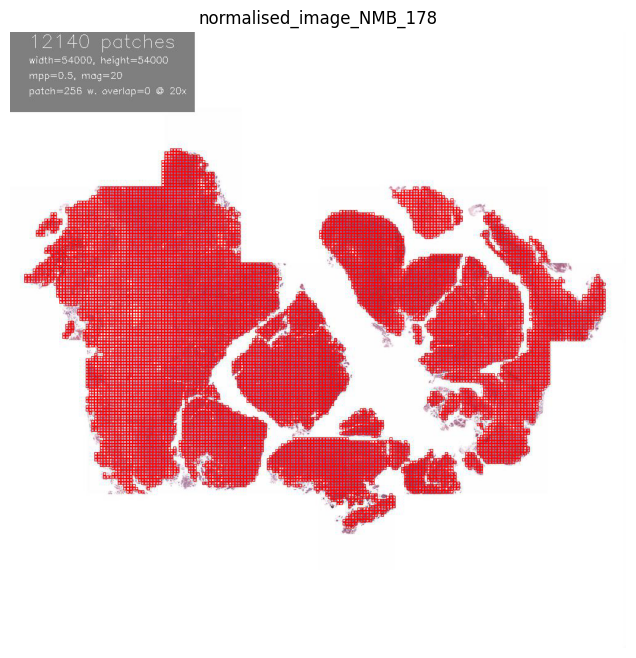

normalised_image_NMB_658


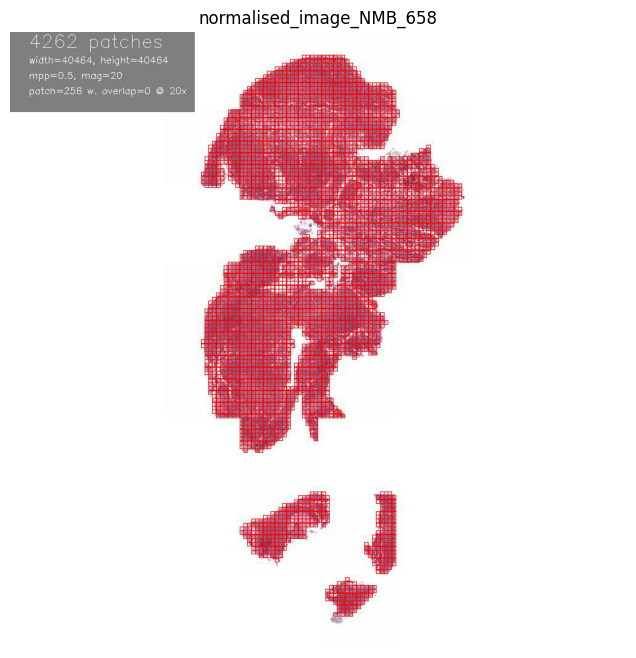

normalised_image_NMB_769


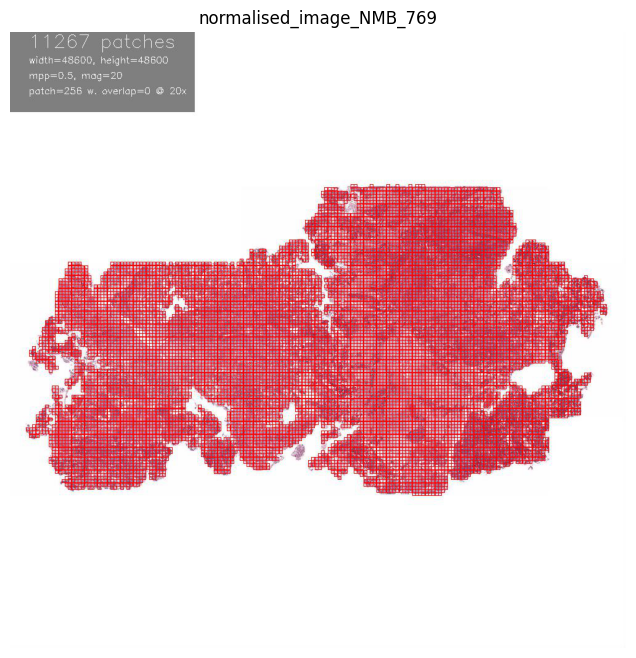

normalised_image_NMB_188


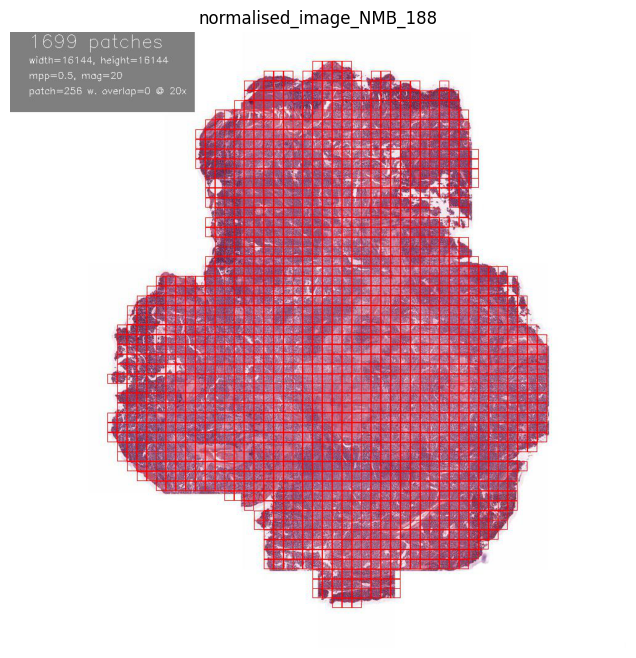

normalised_image_NMB_329


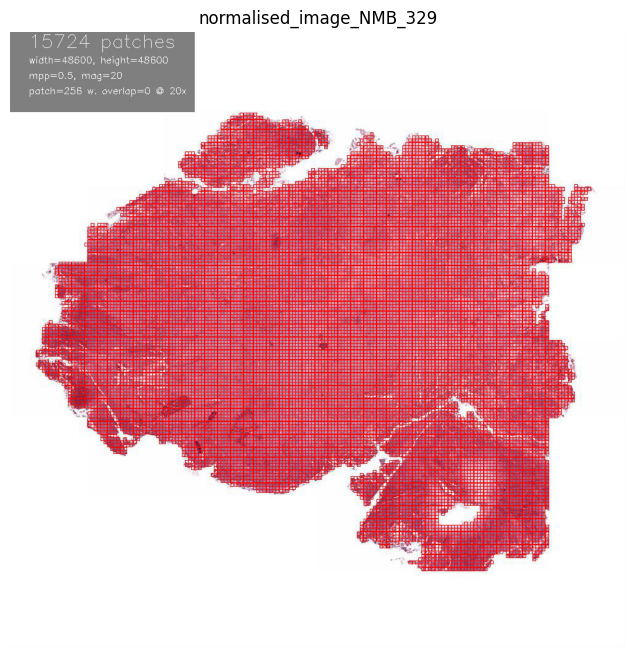

normalised_image_NMB_374


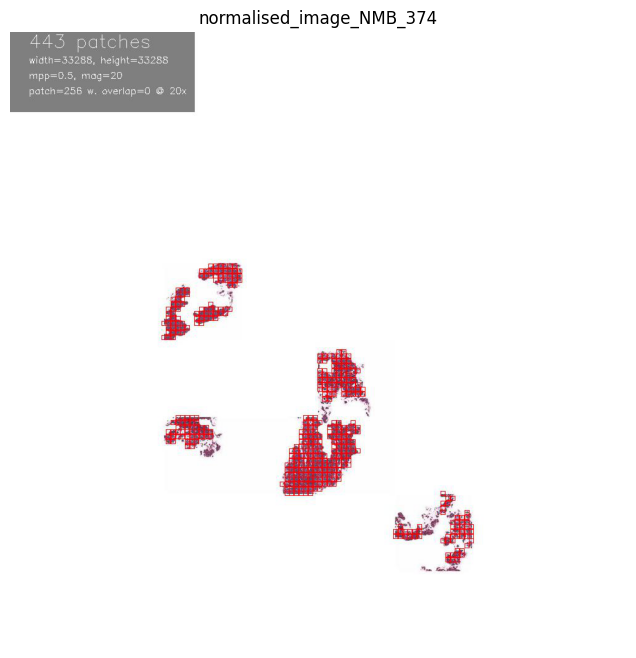

normalised_image_NMB_326


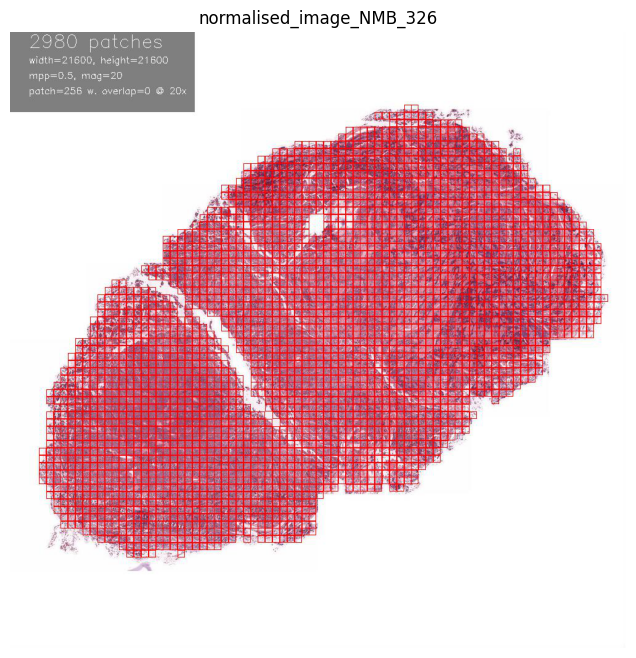

normalised_image_NMB_318


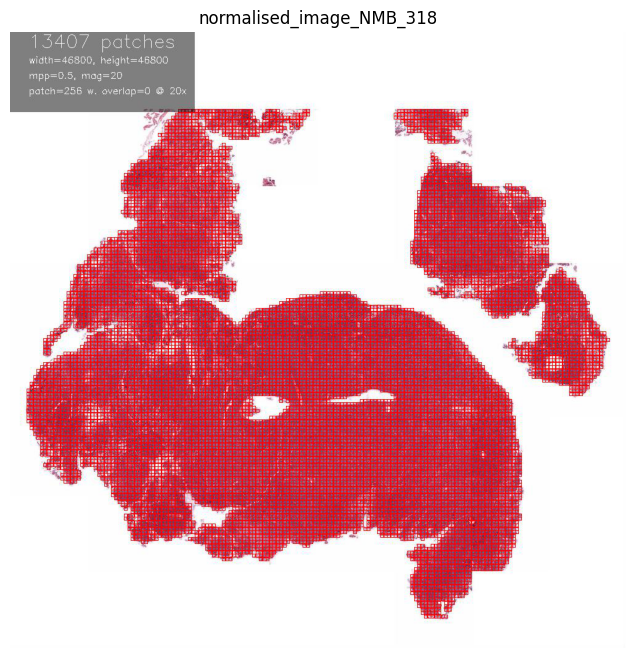

normalised_image_NMB_344


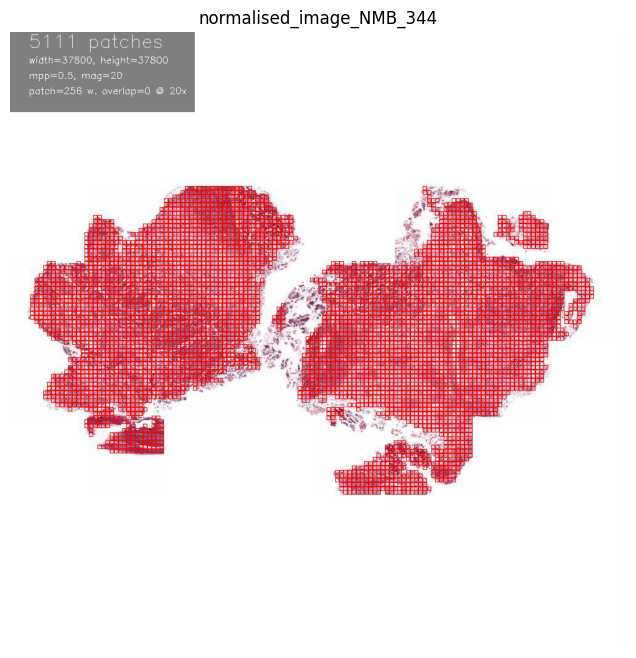

normalised_image_NMB_335


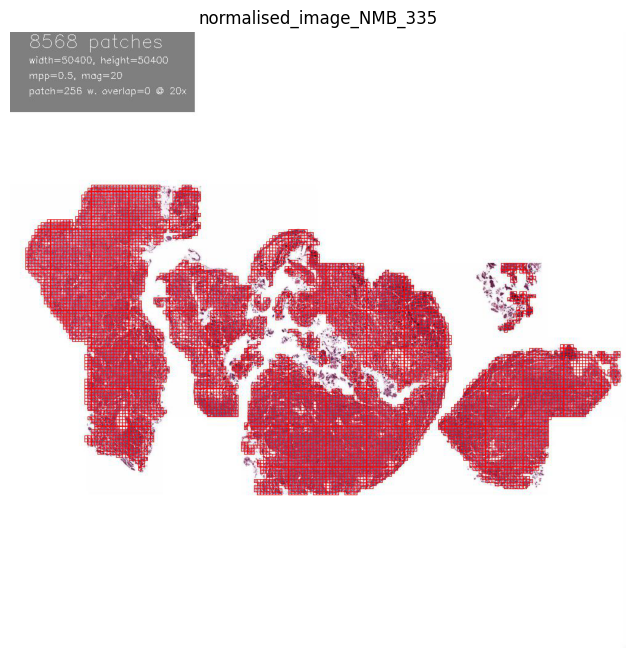

normalised_image_NMB_167


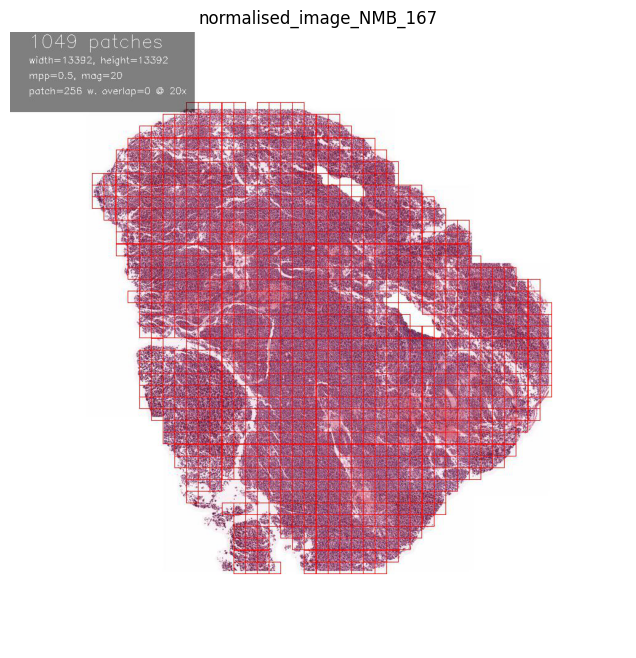

normalised_image_NMB_892


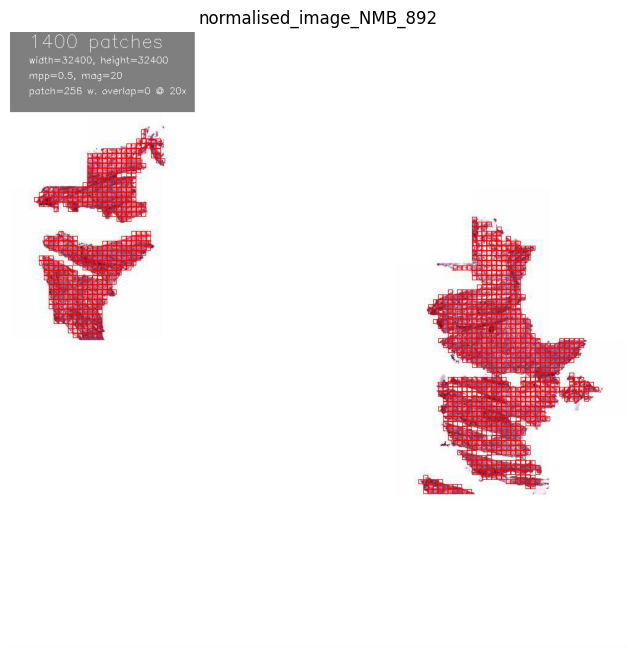

normalised_image_NMB_82


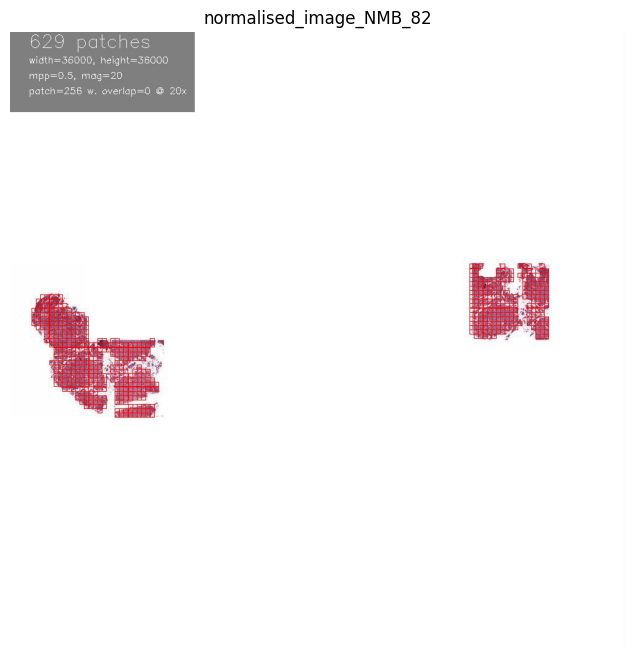

normalised_image_NMB_169


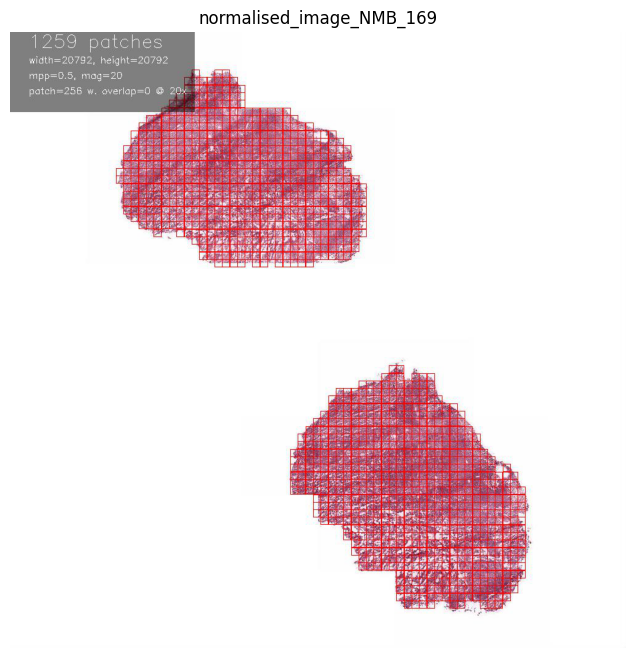

normalised_image_NMB_330


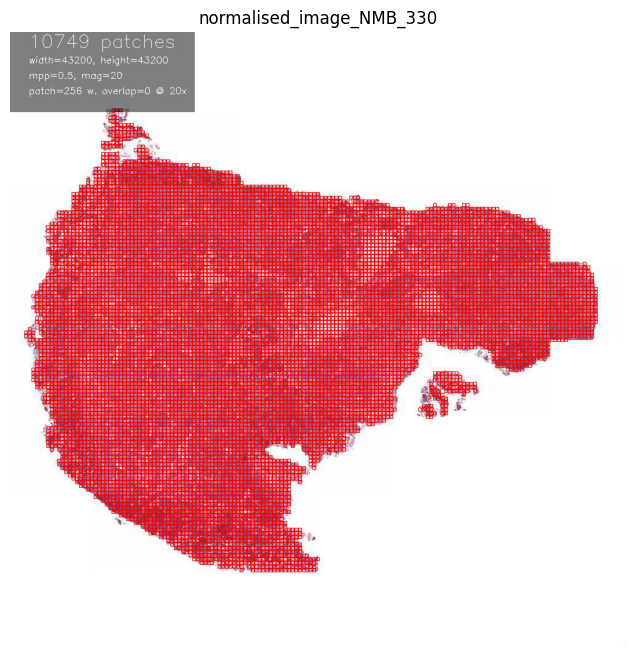

normalised_image_NMB_638


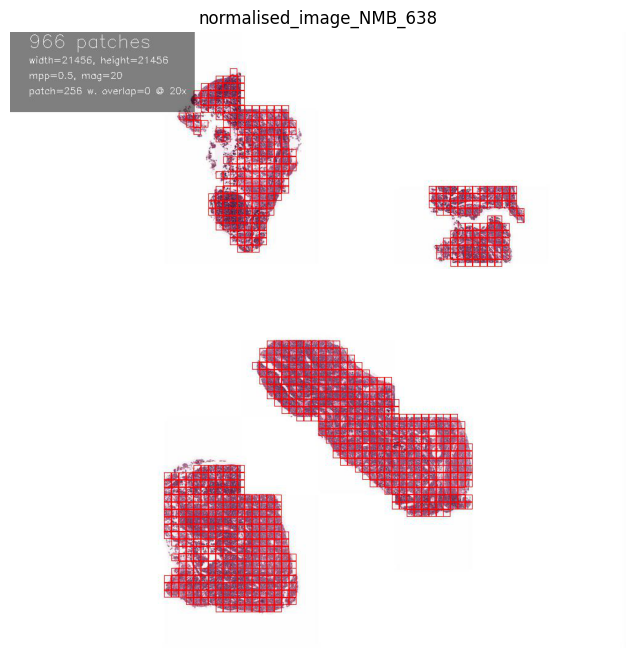

normalised_image_NMB_171


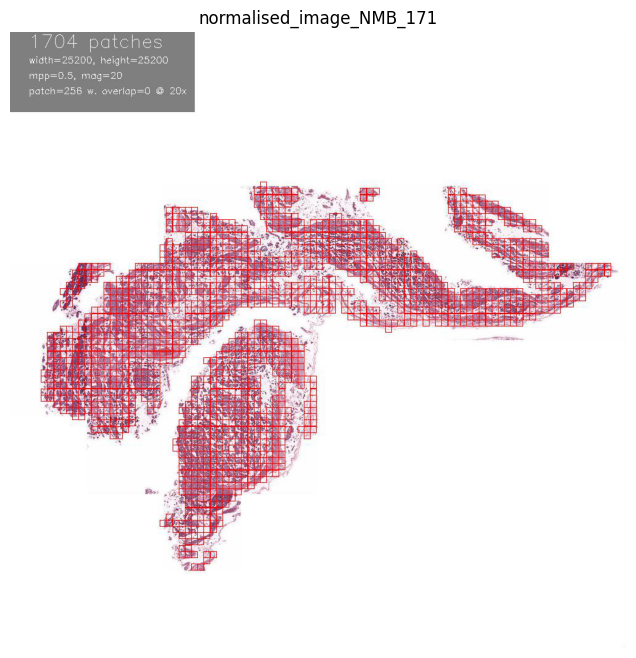

normalised_image_NMB_17


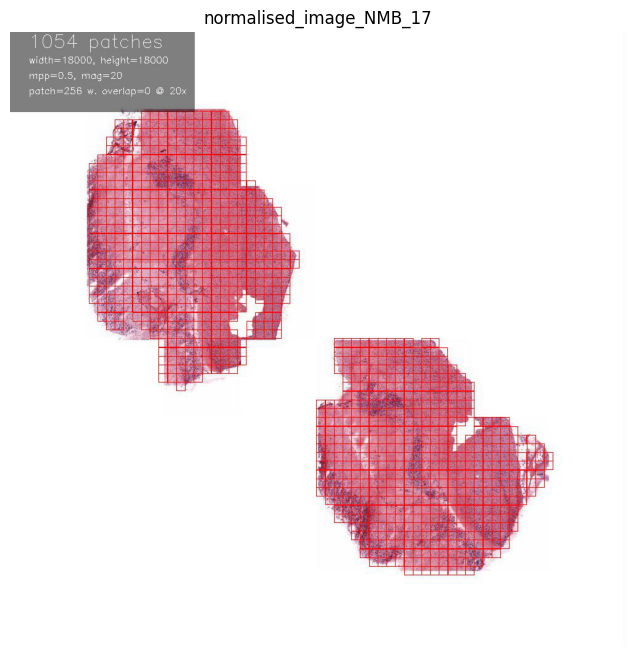

normalised_image_NMB_331


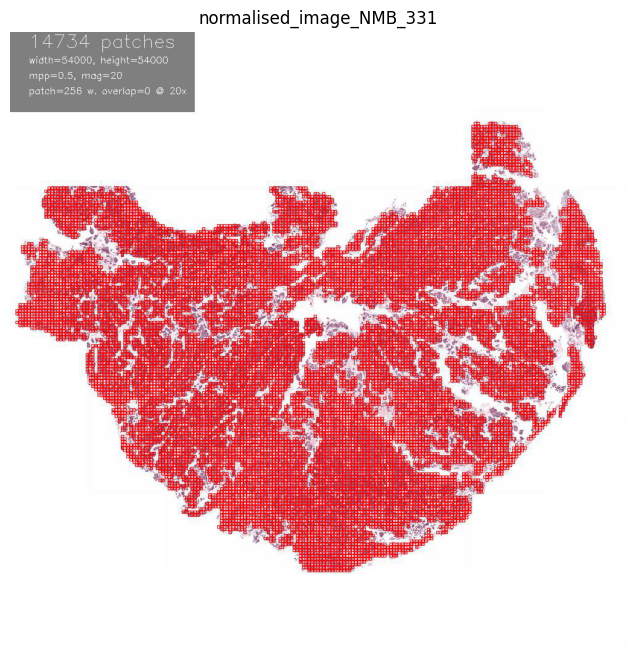

normalised_image_NMB_361


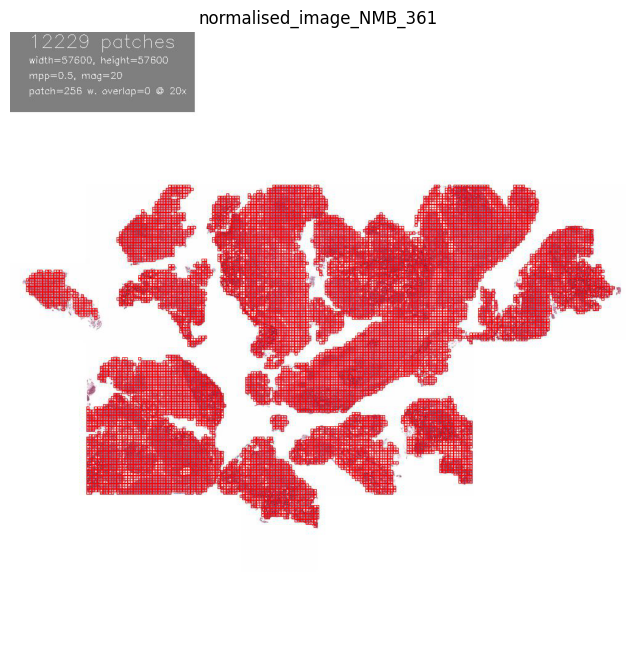

normalised_image_NMB_145


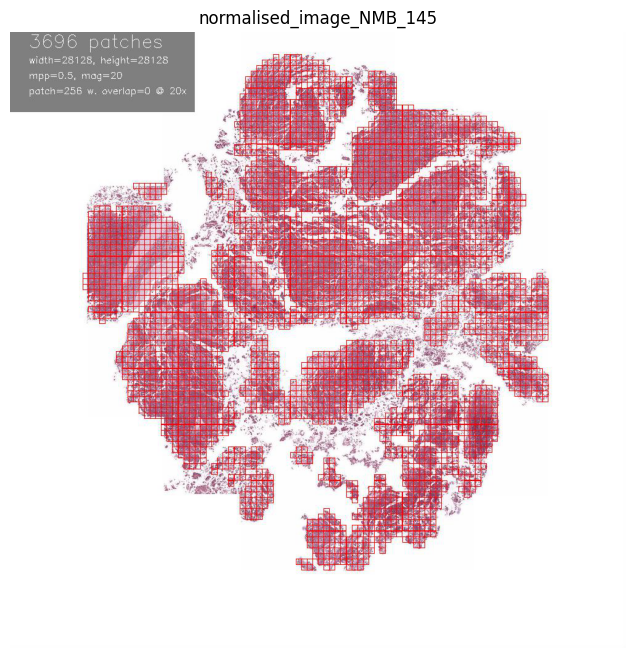

normalised_image_NMB_166


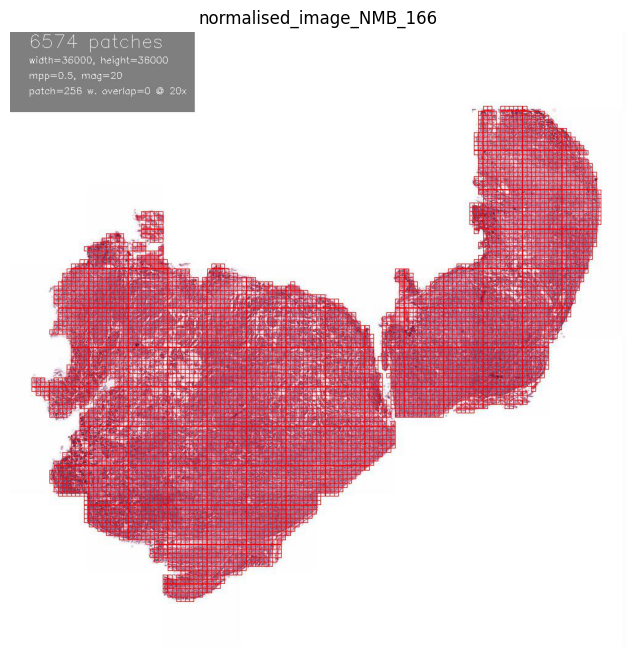

normalised_image_NMB_636


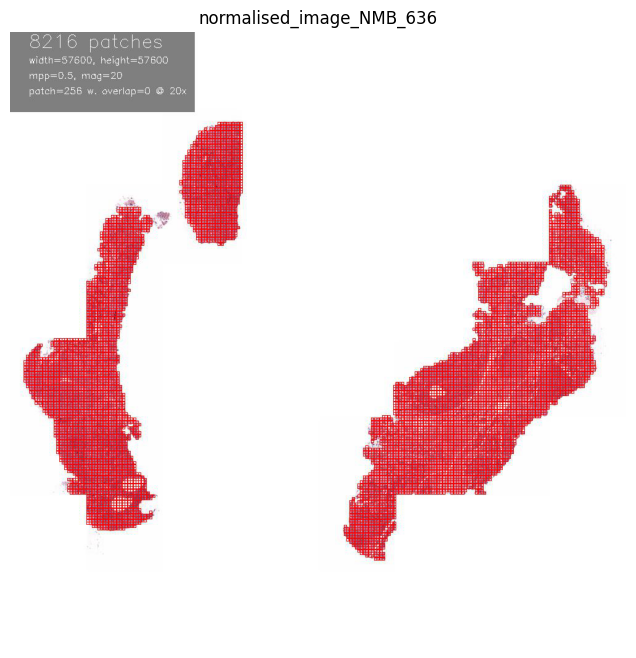

normalised_image_NMB_499


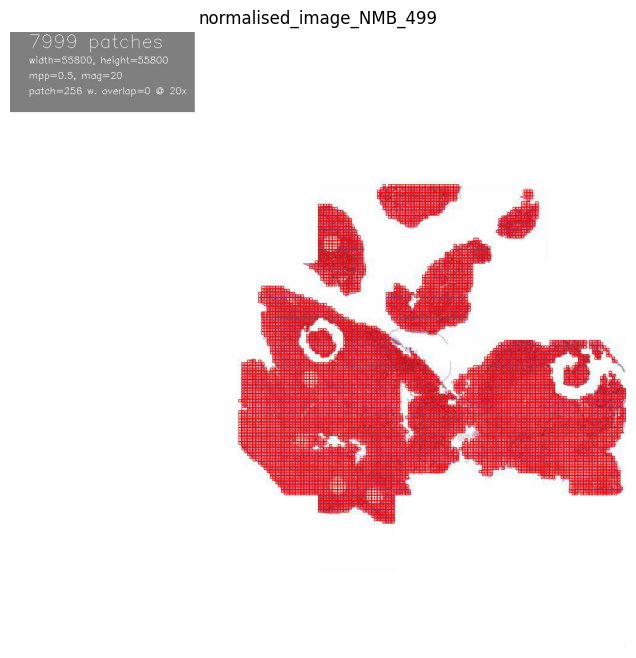

normalised_image_NMB_333


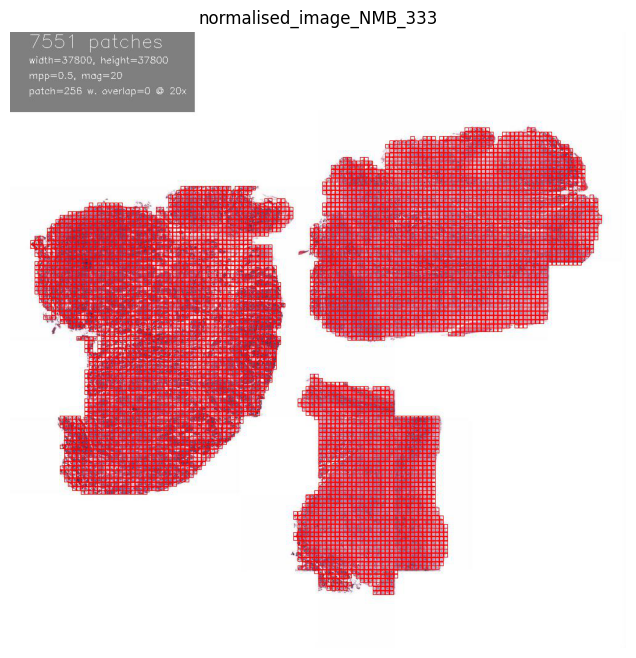

normalised_image_NMB_535


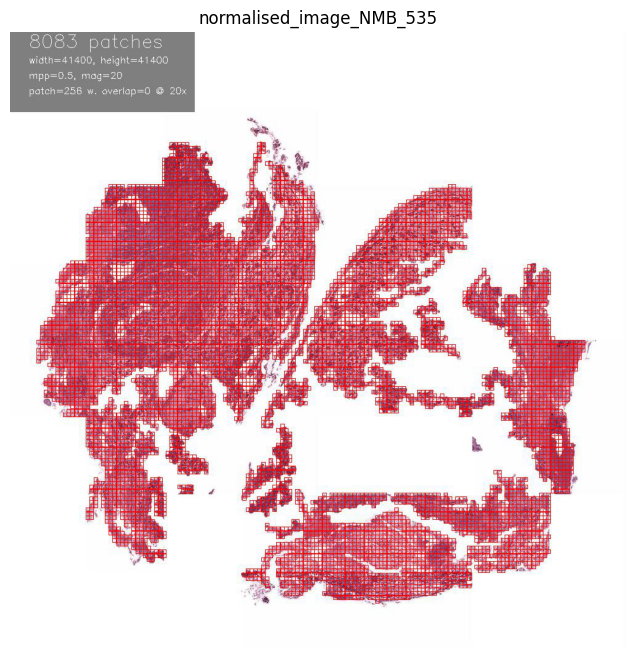

In [8]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

for name, mask, patches, viz_patches in masks_and_patches:
    print(name)
    img = mpimg.imread(viz_patches)
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.title(name)
    plt.axis('off')
    plt.show() 

In [9]:

import timm
from timm.data import resolve_data_config
from timm.data.transforms_factory import create_transform
from huggingface_hub import login

login("hf_REDACTED" )  # login with your User Access Token, found at https://huggingface.co/settings/tokens

# # pretrained=True needed to load UNI weights (and download weights for the first time)
# # init_values need to be passed in to successfully load LayerScale parameters (e.g. - block.0.ls1.gamma)
# model = timm.create_model("hf-hub:MahmoodLab/uni", pretrained=True, init_values=1e-5, dynamic_img_size=True)
# transform = create_transform(**resolve_data_config(model.pretrained_cfg, model=model))
# model.eval() 


In [10]:
# import timm 


# timm_kwargs = {
#    'img_size': 224, 
#    'patch_size': 14, 
#    'depth': 24,
#    'num_heads': 24,
#    'init_values': 1e-5, 
#    'embed_dim': 1536,
#    'mlp_ratio': 2.66667*2,
#    'num_classes': 0, 
#    'no_embed_class': True,
#    'mlp_layer': timm.layers.SwiGLUPacked, 
#    'act_layer': torch.nn.SiLU, 
#    'reg_tokens': 8, 
#    'dynamic_img_size': True
#   }

# model = timm.create_model("hf-hub:MahmoodLab/UNI2-h", pretrained=True, **timm_kwargs)
# transform = create_transform(**resolve_data_config(model.pretrained_cfg, model=model))
# model.eval() 


In [11]:

##Patch-wise feature extraction with UNIv2 via TRIDENT encoder factory

from trident.patch_encoder_models import encoder_factory

Output_folder = "/home/sai/MYC_normalised/segmented/hest-2/"

DEVICE = f"cuda:0" if torch.cuda.is_available() else "cpu"

PATCH_ENCODER = "uni_v2" 

encoder = encoder_factory(PATCH_ENCODER)
encoder.eval()
encoder.to(DEVICE) 

print (encoder)

# Run UNIv2 feature extraction
features_dir = os.path.join(Output_folder, f"features_{PATCH_ENCODER}")

for slide in slides:
    feats_path = slide.extract_patch_features(
        patch_encoder=encoder,
        coords_path=f"/home/sai/MYC_normalised/segmented/hest-2/patches/{slide.name}_patches.h5",
        save_features=features_dir,
        device=DEVICE
    )


UNIv2InferenceEncoder(
  (model): VisionTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 1536, kernel_size=(14, 14), stride=(14, 14))
      (norm): Identity()
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (patch_drop): Identity()
    (norm_pre): Identity()
    (blocks): Sequential(
      (0): Block(
        (norm1): LayerNorm((1536,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1536, out_features=4608, bias=True)
          (q_norm): Identity()
          (k_norm): Identity()
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=1536, out_features=1536, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (ls1): LayerScale()
        (drop_path1): Identity()
        (norm2): LayerNorm((1536,), eps=1e-06, elementwise_affine=True)
        (mlp): GluMlp(
          (fc1): Linear(in_features=1536, out_features=8192, bias=True)
          (act): SiL

In [12]:
import h5py

def print_attrs(name, obj):
    print(f"Object: {name}")
    for key, value in obj.attrs.items():
        print(f"  Attribute - {key}: {value}")

features = []

for slide in slides:
     name = slide.name
     feats_path = f"/home/sai/MYC_normalised/segmented/hest-2/features_uni_v2/{slide.name}.h5"
     features.append((name,feats_path))


for name, feats_path in features:
    print(f"Contents and Attributes in {name} feats file")
    with h5py.File(feats_path, 'r') as h5_file:
        h5_file.visititems(print_attrs) 

Contents and Attributes in normalised_image_NMB_178 feats file
Object: coords
  Attribute - level0_height: 54000
  Attribute - level0_magnification: 20
  Attribute - level0_width: 54000
  Attribute - name: normalised_image_NMB_178
  Attribute - overlap: 0
  Attribute - patch_size: 256
  Attribute - patch_size_level0: 256
  Attribute - savetodir: /home/sai/MYC_normalised/segmented/hest-2/
  Attribute - target_magnification: 20
Object: features
  Attribute - encoder: uni_v2
  Attribute - name: normalised_image_NMB_178
  Attribute - savetodir: /home/sai/MYC_normalised/segmented/hest-2/features_uni_v2
Contents and Attributes in normalised_image_NMB_658 feats file
Object: coords
  Attribute - level0_height: 40464
  Attribute - level0_magnification: 20
  Attribute - level0_width: 40464
  Attribute - name: normalised_image_NMB_658
  Attribute - overlap: 0
  Attribute - patch_size: 256
  Attribute - patch_size_level0: 256
  Attribute - savetodir: /home/sai/MYC_normalised/segmented/hest-2/
  At

In [13]:
## Inspecting and combining patch-wise features encoded with UNIv2

import h5py
import numpy as np

def print_attrs(name, obj):
    print(f"Object: {name}")
    for key, value in obj.attrs.items():
        print(f"  Attribute - {key}: {value}")

features = []

for slide in slides:
     name = slide.name
     feats_path = f"/home/sai/MYC_normalised/segmented/hest-2/features_uni_v2/{slide.name}.h5"
     features.append((name,feats_path))


for name, feats_path in features:
    print(f"Contents and Attributes in {name} feats file")
    with h5py.File(feats_path, 'r') as h5_file:
        h5_file.visititems(print_attrs) 


feat_sets = []

for name, feats_path in features:
    h5 = h5py.File(feats_path,"r")
    feats = h5['features'][:]
    feat_sets.append((name,feats))


for name, feats in feat_sets:
    print(name, feats.shape)


comb_feat_set = np.vstack([feats for name,feats in feat_sets])

comb_feat_set_names = np.concatenate([[name] * len(feats) for name, feats in feat_sets])


print(comb_feat_set[:5])
print(comb_feat_set_names[:5]) 

for name,feats in feat_sets:
    print(len(feats)) 

Contents and Attributes in normalised_image_NMB_178 feats file
Object: coords
  Attribute - level0_height: 54000
  Attribute - level0_magnification: 20
  Attribute - level0_width: 54000
  Attribute - name: normalised_image_NMB_178
  Attribute - overlap: 0
  Attribute - patch_size: 256
  Attribute - patch_size_level0: 256
  Attribute - savetodir: /home/sai/MYC_normalised/segmented/hest-2/
  Attribute - target_magnification: 20
Object: features
  Attribute - encoder: uni_v2
  Attribute - name: normalised_image_NMB_178
  Attribute - savetodir: /home/sai/MYC_normalised/segmented/hest-2/features_uni_v2
Contents and Attributes in normalised_image_NMB_658 feats file
Object: coords
  Attribute - level0_height: 40464
  Attribute - level0_magnification: 20
  Attribute - level0_width: 40464
  Attribute - name: normalised_image_NMB_658
  Attribute - overlap: 0
  Attribute - patch_size: 256
  Attribute - patch_size_level0: 256
  Attribute - savetodir: /home/sai/MYC_normalised/segmented/hest-2/
  At

/home/sai/miniconda3/envs/trident/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


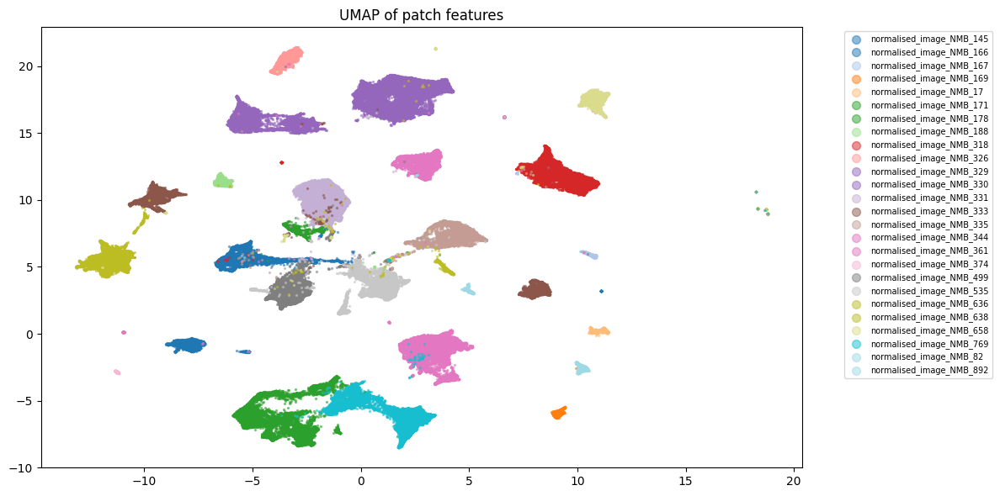

In [14]:
### UMAP and PacMAP with combined feature set

import umap
import h5py
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm


reducer = umap.UMAP(n_components=2,random_state=43)

embeddings = reducer.fit_transform(comb_feat_set)

unique_names = np.unique(comb_feat_set_names)
colors = cm.tab20(np.linspace(0, 1, len(unique_names)))

plt.figure(figsize=(12, 6))
for name, color in zip(unique_names, colors):
    mask = comb_feat_set_names == name
    plt.scatter(embeddings[mask, 0], embeddings[mask, 1], 
                label=name, s=2, alpha=0.5, color=color)

plt.legend(markerscale=5, 
           bbox_to_anchor=(1.05, 1),
           loc='upper left', 
           fontsize=7)
plt.title("UMAP of patch features")
plt.tight_layout()
plt.savefig("/home/sai/MYC_normalised/segmented/hest-2/umap_features.png", dpi=150, bbox_inches='tight') 

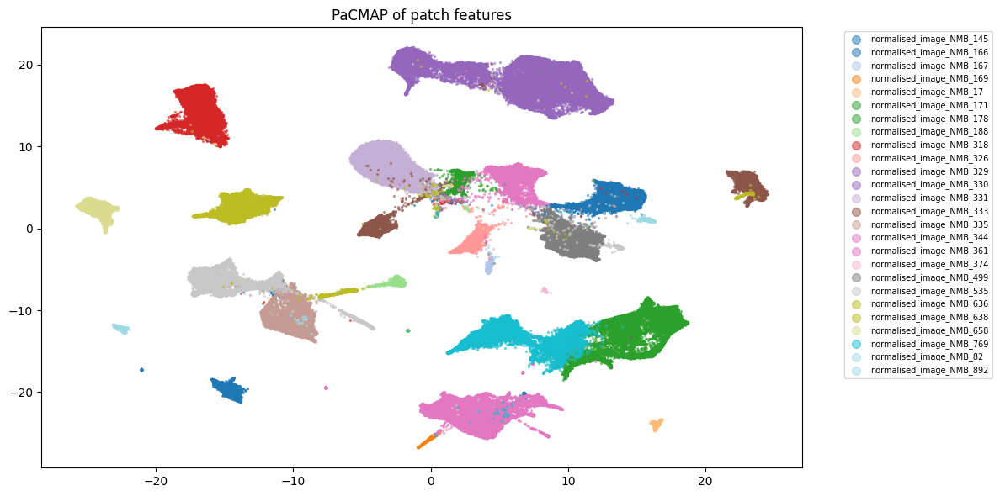

In [15]:
import pacmap
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm


reducer = pacmap.PaCMAP(n_components=2, random_state=42)
embeddings = reducer.fit_transform(comb_feat_set)


unique_names = np.unique(comb_feat_set_names)
colors = cm.tab20(np.linspace(0, 1, len(unique_names)))

plt.figure(figsize=(12, 6))
for name, color in zip(unique_names, colors):
    mask = comb_feat_set_names == name
    plt.scatter(embeddings[mask, 0], embeddings[mask, 1], 
                label=name, s=2, alpha=0.5, color=color)

plt.legend(markerscale=5,
           bbox_to_anchor=(1.05, 1),
           loc='upper left',
           fontsize=7)
plt.title("PaCMAP of patch features")
plt.tight_layout()
plt.savefig("/home/sai/MYC_normalised/segmented/hest-2/pacmap_features.png", dpi=150, bbox_inches='tight') 

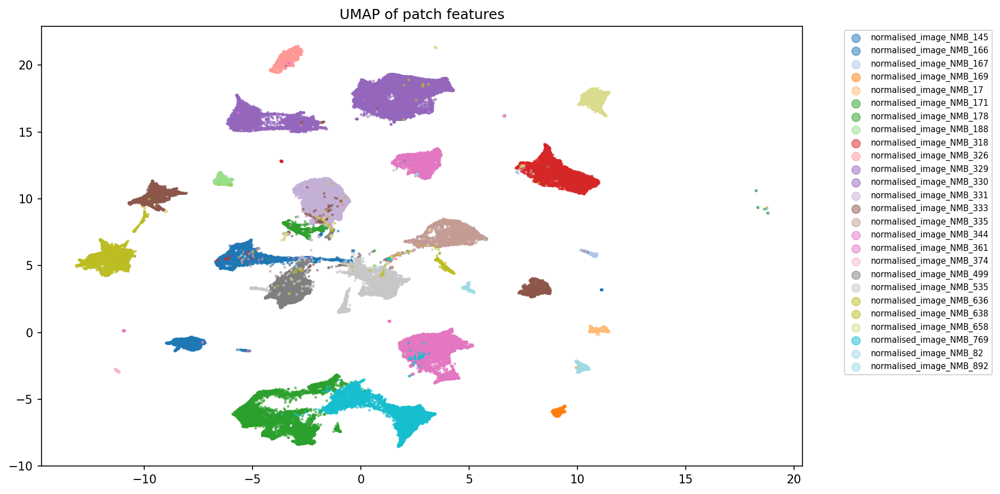

In [16]:
from IPython.display import Image
Image("/home/sai/MYC_normalised/segmented/hest-2/umap_features.png") 

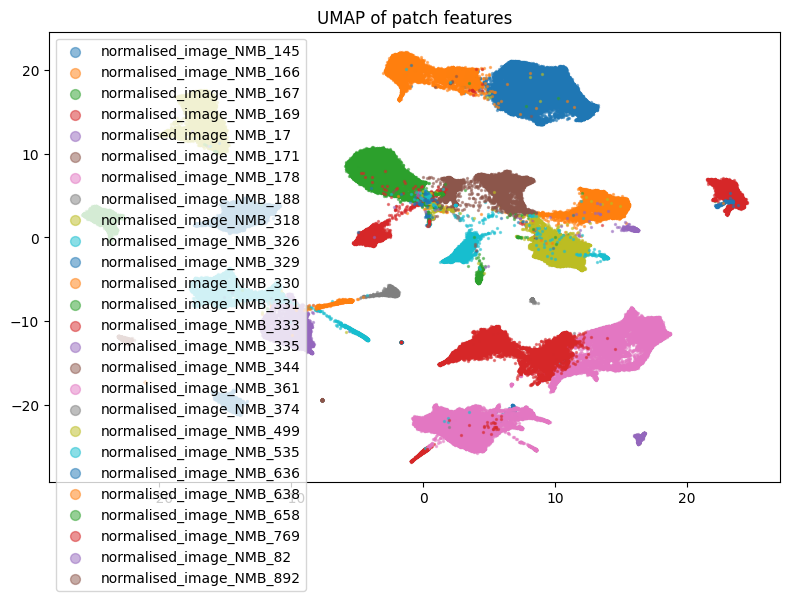

In [17]:
plt.figure(figsize=(8, 6))
for name in np.unique(comb_feat_set_names):
    mask = comb_feat_set_names == name
    plt.scatter(embeddings[mask, 0], embeddings[mask, 1], label=name, s=2, alpha=0.5)

plt.legend(markerscale=5)
plt.title("UMAP of patch features")
plt.tight_layout()
plt.savefig("umap_features.pdf") 

In [ ]:
###Slide-wise UMAP embeddings- visualised for UMAP1


import umap
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import h5py

slide_wise_umap = []

for name, feats_path in features:
    h5_path = f"/home/sai/MYC_normalised/segmented/hest-2/features_uni_v2/{name}.h5"
    with h5py.File(h5_path, 'r') as f:
        feats = f['features'][:]
        coords = f['coords'][:]
    
    reducer = umap.UMAP(n_components=2, random_state=42)
    embedding = reducer.fit_transform(feats)
    
    umap1 = (embedding[:, 0] - embedding[:, 0].min()) / (embedding[:, 0].max() - embedding[:, 0].min())
    umap2 = (embedding[:, 1] - embedding[:, 1].min()) / (embedding[:, 1].max() - embedding[:, 1].min())
    
    slide_wise_umap.append((name, coords, embedding, umap1, umap2))

for name, coords, embedding, umap1, umap2 in slide_wise_umap:
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    
    #  UMAP coloured by UMAP1 position
    axes[0].scatter(embedding[:, 0], embedding[:, 1],
                    c=umap1, cmap='viridis', s=2, alpha=0.5)
    axes[0].set_title(f"UMAP {name}")
    axes[0].set_xlabel("UMAP 1")
    axes[0].set_ylabel("UMAP 2")
    
    # patches on slide coloured by UMAP1 position
    sc = axes[1].scatter(coords[:, 0], coords[:, 1],
                    c=umap1, cmap='viridis', s=2, alpha=0.7)
    axes[1].set_title("Patches on slide coloured by UMAP 1")
    axes[1].set_xlabel("x coordinate")
    axes[1].set_ylabel("y coordinate")
    axes[1].invert_yaxis()
    
    plt.colorbar(sc, ax=axes[1], label='UMAP 1')
    plt.tight_layout()
    plt.savefig(f"/home/sai/MYC_normalised/segmented/hest-2/{name}_umap.png", dpi=150, bbox_inches='tight')
    plt.show()

/home/sai/miniconda3/envs/trident/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/sai/miniconda3/envs/trident/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/sai/miniconda3/envs/trident/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/sai/miniconda3/envs/trident/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/sai/miniconda3/envs/trident/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/sai/miniconda3/envs/trident/lib/python3.11/site-p

In [ ]:
import umap
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import h5py

slide_wise_umap = []

for name, feats_path in features:
    h5_path = f"/home/sai/MYC_normalised/segmented/hest-2/features_uni_v2/{name}.h5"
    with h5py.File(h5_path, 'r') as f:
        feats = f['features'][:]
        coords = f['coords'][:]
    
    reducer = umap.UMAP(n_components=2, random_state=42)
    embedding = reducer.fit_transform(feats)
    
    umap1 = (embedding[:, 0] - embedding[:, 0].min()) / (embedding[:, 0].max() - embedding[:, 0].min())
    umap2 = (embedding[:, 1] - embedding[:, 1].min()) / (embedding[:, 1].max() - embedding[:, 1].min())
    
    slide_wise_umap.append((name, coords, embedding, umap1, umap2))

for name, coords, embedding, umap1, umap2 in slide_wise_umap:
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    
    # UMAP coloured by UMAP2 position
    axes[0].scatter(embedding[:, 0], embedding[:, 1],
                    c=umap2, cmap='viridis', s=2, alpha=0.5)
    axes[0].set_title(f"UMAP {name}")
    axes[0].set_xlabel("UMAP 1")
    axes[0].set_ylabel("UMAP 2")
    
    # patches on slide coloured by UMAP2 position
    sc = axes[1].scatter(coords[:, 0], coords[:, 1],
                    c=umap2, cmap='viridis', s=2, alpha=0.7)
    axes[1].set_title("Patches on slide coloured by UMAP 2")
    axes[1].set_xlabel("x coordinate")
    axes[1].set_ylabel("y coordinate")
    axes[1].invert_yaxis()
    
    plt.colorbar(sc, ax=axes[1], label='UMAP 2')
    plt.tight_layout()
    plt.savefig(f"/home/sai/MYC_normalised/segmented/hest-2/{name}_umap.png", dpi=150, bbox_inches='tight')
    plt.show()

[ 5376 12800]
(10749, 2)


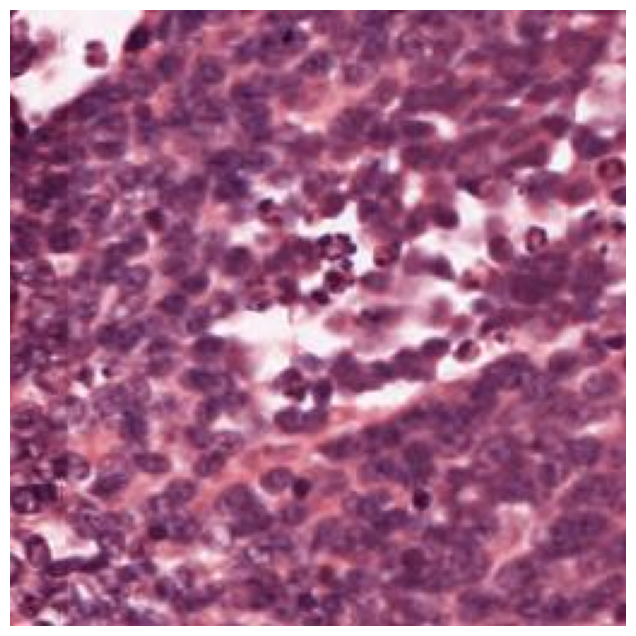

In [ ]:
### Reading a test patch 

import h5py
import openslide
from PIL import Image
import numpy as np

coords_path = "/home/sai/MYC_normalised/segmented/hest-2/patches/normalised_image_NMB_330_patches.h5"

with h5py.File(coords_path,'r') as f:
     coords = f["coords"][:]

slide_path = "/home/sai/MYC_normalised/new_normalised_images/normalised_image_NMB_330.tif"

slide = openslide.OpenSlide(slide_path)

print(coords[1000])

print(coords.shape)

x, y = coords[1000]
patch = slide.read_region((int(x), int(y)), 0, (256, 256))

patch_array = np.array(patch.convert("RGB")) 

plt.figure(figsize=(8, 8))
plt.imshow(patch_array)
plt.axis('off')
plt.show() 


In [ ]:
#### Patch-wise Nuclei segmentation with Instanseg 

from instanseg import InstanSeg
from instanseg.utils.utils import show_images
import numpy as np
import h5py

DEVICE = f"cuda:0" if torch.cuda.is_available() else "cpu"

instanseg_brightfield = InstanSeg("brightfield_nuclei", image_reader = "auto", verbosity=1, device = DEVICE)

patches_dir = "/home/sai/MYC_normalised/segemeted/hest-2/patches/"

output_dir = "/home/sai/MYC_normalised/segmented/hest-2/patches/instanseg_segmentation_output/"

os.makedirs(output_dir, exist_ok=True)

patches = []

for slide in slides:
    name = slide.name
    coords_path = f"/home/sai/MYC_normalised/segmented/hest-2/patches/{name}_patches.h5"
    with h5py.File(coords_path, 'r') as f:
        coord_array = f["coords"][:]
    for i, coord_pair in enumerate(coord_array):
        x, y = coord_pair[:2]
        patch_name = f"patch{i}_{name}"
        patches.append((slide, patch_name, x, y))

patch_seg = []

for slide,patch_name, x, y in patches:
    name = patch_name
    patch = slide.read_region((x,y),0,(256,256))
    patch_array = np.array(patch.convert("RGB"))
    labeled_output = instanseg_brightfield.eval_small_image(
        image=patch_array,
        pixel_size=0.5,
        return_image_tensor=False,
        normalise = True
        
    )
    instanseg_brightfield.save_output(
    image_path=os.path.join(output_dir, name),
    labels=labeled_output,
    image_array=patch_array,
    save_output=True,
    save_overlay=True,
    save_geojson=True
    )
    patch_seg.append((slide,name,patch_array,labeled_output)) 


# for slide,name,patch_array,labeled_output in patch_seg:
#     display = instanseg_brightfield.display(patch_array, labeled_output)
#     show_images(patch_array,display, colorbar=False, titles = [f"Original{name}", f"{name} with segmentation"]) 


Model brightfield_nuclei version 0.1.1 already downloaded in /home/sai/miniconda3/envs/trident/lib/python3.11/site-packages/instanseg/utils/../bioimageio_models/, loading
Saving output to /home/sai/MYC_normalised/segmented/hest-2/patches/instanseg_segmentation_output/patch0_normalised_image_NMB_178_instanseg_prediction.tiff
Saving geojson to /home/sai/MYC_normalised/segmented/hest-2/patches/instanseg_segmentation_output/patch0_normalised_image_NMB_178_instanseg_prediction.geojson
Saving overlay to /home/sai/MYC_normalised/segmented/hest-2/patches/instanseg_segmentation_output/patch0_normalised_image_NMB_178_instanseg_prediction_overlay.tiff
Saving output to /home/sai/MYC_normalised/segmented/hest-2/patches/instanseg_segmentation_output/patch1_normalised_image_NMB_178_instanseg_prediction.tiff
Saving geojson to /home/sai/MYC_normalised/segmented/hest-2/patches/instanseg_segmentation_output/patch1_normalised_image_NMB_178_instanseg_prediction.geojson
Saving overlay to /home/sai/MYC_norma

Saving geojson to /home/sai/MYC_normalised/segmented/hest-2/patches/instanseg_segmentation_output/patch614_normalised_image_NMB_178_instanseg_prediction.geojson
Saving overlay to /home/sai/MYC_normalised/segmented/hest-2/patches/instanseg_segmentation_output/patch614_normalised_image_NMB_178_instanseg_prediction_overlay.tiff
Saving output to /home/sai/MYC_normalised/segmented/hest-2/patches/instanseg_segmentation_output/patch615_normalised_image_NMB_178_instanseg_prediction.tiff
Saving geojson to /home/sai/MYC_normalised/segmented/hest-2/patches/instanseg_segmentation_output/patch615_normalised_image_NMB_178_instanseg_prediction.geojson
Saving overlay to /home/sai/MYC_normalised/segmented/hest-2/patches/instanseg_segmentation_output/patch615_normalised_image_NMB_178_instanseg_prediction_overlay.tiff
Saving output to /home/sai/MYC_normalised/segmented/hest-2/patches/instanseg_segmentation_output/patch616_normalised_image_NMB_178_instanseg_prediction.tiff
Saving geojson to /home/sai/MYC_

In [ ]:
### Reading patch coordinates - to visualise patches as slide regions

import h5py

for f_path in glob.glob('/home/sai/MYC_normalised/segmented/hest-2/patches/*.h5')[:2]:
    with h5py.File(f_path) as f:
        print(f_path)
        for k in f.keys():
            print('  ', k, f[k].shape, f[k].dtype) 

patches = []

for slide in slides:
    patches_dir = f"/home/sai/MYC_normalised/segmented/hest-2/patches/{slide.name}_patches.h5"
    with h5py.File(patches_dir, 'r') as f:
        coord_array = f["coords"][:]
        print(list(f.keys()))
    for i, coord_pair in enumerate(coord_array):
        x, y = coord_pair[:2]
        patch_name = f"patch{i}_{slide.name}"
        patches.append((slide, patch_name, x, y)) 

/home/sai/MYC_normalised/segmented/hest-2/patches/normalised_image_NMB_17_patches.h5
   coords (1054, 2) int64
/home/sai/MYC_normalised/segmented/hest-2/patches/normalised_image_NMB_82_patches.h5
   coords (629, 2) int64
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']
['coords']


In [ ]:
### Defining functions to convert patch coordinates to GEOJSON polygons and patch-wise nuclei masks to WSI-level, to visualise them as annotations and detections on QuPath

import json
import numpy as np
from pathlib import Path
import shutil

PATCHES_DIR = Path("/home/sai/MYC_normalised/segmented/hest-2/patches/")

NUCLEI_GJSON_DIR = Path("/home/sai/MYC_normalised/segmented/hest-2/patches/instanseg_segmentation_output/")

GEOJSON_OUTPUT_DIR = Path("/home/sai/QuPath_export/")

if GEOJSON_OUTPUT_DIR.exists():
    shutil.rmtree(GEOJSON_OUTPUT_DIR)

GEOJSON_OUTPUT_DIR.mkdir(parents = True, exist_ok = True) 

PATCH_SIZE = 256


def make_rectangle(x,y,w,h,patch_name):
    """GeoJSON Feature:closed polygon rectangle = QuPath Annotation - for patches"""
    coords = [[ [x,    y],
                  [x + w, y],
                  [x + w, y + h],
                  [x,     y + h],
                [x,     y] ]]
    
    return { "type" : "Feature" , 
            "geometry" : {"type": "Polygon", "coordinates": coords},
            "properties" : { "objectType": "annotation",
                            "name": patch_name,
                            "classification" : {"name": "Patch", "color" : [0,113,188]}
                                } 
                                                
                            }


def nuclei_coords_shift(feature,dx,dy):
    """Return a new feature with coordinates shifted by (dx,dy), typed as a Qupath detection object- for nuclei """
    def shift(coords):
        if isinstance(coords[0], list):
            return[shift(c) for c in coords]
        return[coords[0] + dx,coords[1] + dy]
    
    geom = json.loads(json.dumps(feature.get("geometry",{})))
    geom["coordinates"] = shift(geom["coordinates"])

    props = dict(feature.get("properties") or {})
    props["objectType"] = "detection"

    return{"type" : "Feature", "geometry" : geom, "properties" : props} 


In [ ]:
## Creating patch and detected nuclei as GeoJSON objects for QuPath 
import h5py

h5_files = sorted(PATCHES_DIR.glob("*patches.h5"))
if not h5_files:
    raise FileNotFoundError(f"No .h5 files found in {PATCHES_DIR}")

print(f"Found {len(h5_files)} slides\n")

for h5_path in h5_files:
    stem = h5_path.stem
    slide_name = stem.replace("_patches", "")

    with h5py.File(h5_path, "r") as f:
        coord_array = f["coords"][:]

    features = []
    n_nuclei = 0
    n_missing = 0

    for i, coord_pair in enumerate(coord_array):
        x, y = int(coord_pair[0]), int(coord_pair[1])
        patch_name = f"patch{i}_{slide_name}"

        features.append(make_rectangle(x, y, PATCH_SIZE, PATCH_SIZE, patch_name))

        geojson_path = NUCLEI_GJSON_DIR / f"patch{i}_{slide_name}_instanseg_prediction.geojson"

        if geojson_path.exists():
            with open(geojson_path) as gf:
                gj = json.load(gf)
            for feat in gj.get("features", []):
                features.append(nuclei_coords_shift(feat, x, y))
                n_nuclei += 1
        else:
            n_missing += 1

    out_geojson = GEOJSON_OUTPUT_DIR / f"{slide_name}_qupath.geojson"
    with open(out_geojson, "w") as out:
        json.dump({"type": "FeatureCollection", "features": features}, out)

    print(f"Slide     : {slide_name}")
    print(f"Patches   : {len(coord_array)}")
    print(f"Nuclei    : {n_nuclei}")
    print(f"No GeoJSON: {n_missing}")
    print()